# Задача 4 "Разработка нефтегазовых месторождений"

Набор данных содержит 442 о различных нефтегазовых месторождениях.
Тренировочный набор - 309 строк.
Тестовый набор - 133 строк.

Каждое месторождение обладает 19 параметрами:
1. Field name - название месторождения
2. Reservoir unit - юнит месторождения
3. Country - страна расположения
4. Region - регион расположения
5. Basin name - название бассейна пород
6. Tectonic regime - тектонический режим
7. Latitude - широта
8. Longitude - долгота
9. Operator company - название компании
10. Onshore or oﬀshore - на суше или нет
11. Hydrocarbon type (main) - тип углеводорода
12. Reservoir status (current) - статус месторождения
13. Structural setting - структурные свойства
14. Depth (top reservoir ft TVD) - глубина
15. Reservoir period - литологический период
16. Lithology (main) - литология
17. Thickness (gross average ft) - общая толщина
18. Thickness (net pay average ft) - эффективная толщина
19. Porosity (matrix average 20. Permeability (air average mD) – проницаемость

https://www.kaggle.com/competitions/oilgas-field-prediction

## Считывание данных

In [1]:
# иморитирование всех необходимых библиотек
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Считываем тренировочные данные
train = pd.read_csv("files//train_oil.csv")

print(f"Train dataset shape: {train.shape}")

Train dataset shape: (309, 20)


In [3]:
# Считываем тестовые данные
test = pd.read_csv("files//oil_test.csv")

print(f"Test dataset shape: {test.shape}")

Test dataset shape: (133, 19)


In [4]:
# Посмотрим как выглядят данные
train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Structural setting,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
0,ZHIRNOV,MELEKESKIAN,RUSSIA,FORMER SOVIET UNION,VOLGA-URAL,COMPRESSION/EVAPORITE,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,OIL,DECLINING PRODUCTION,FORELAND,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,LATIN AMERICA,ESPIRITO SANTO,EXTENSION,-19.6017,-39.8332,PETROBRAS,ONSHORE,OIL,NEARLY DEPLETED,PASSIVE MARGIN,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,MIDDLE EAST,THE GULF,COMPRESSION/EVAPORITE,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,OIL,REJUVENATING,FORELAND,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0
3,MURCHISON,BRENT,UK /NORWAY,EUROPE,NORTH SEA NORTHERN,EXTENSION,61.3833,1.7500,CNR,OFFSHORE,OIL,NEARLY DEPLETED,RIFT,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,NORTH AMERICA,WESTERN CANADA,COMPRESSION,53.2287,-115.8008,NUMEROUS,ONSHORE,OIL,UNKNOWN,FORELAND,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0


## Исследование и обработка данных

Представьте, что Вы решили посмотреть фильм с друзьями. Чтобы не ошибиться с выбором и посмотреть дейтвительно хороший фильм, вы наверняка зададителсь множеством вопросов. Какой жанр у фильма? В каком году он был снят? Какой у фильма актерский состав и съемочная группа? Обычно перед просмотром люди также смотрят трейлер фильма на YouTube. Кроме того, вы бы посмотрели рейтинг фильма на imdb и обзоры фильм от других зрителей.

В любом случае, прежде чем посмотреть какой-либо фильм, вы наверняка провели небольшое исследование касательно фильма.

В анализе данных это работает примерно также и прежде чем приступить к работе данных, обычно датасаентисты исследуют что же за данные к ним пришли.

**Разведочный анализ данных (Exploratory Data Analysis, EDA)** – предварительное исследование Датасета (Dataset) с целью определения его основных характеристик, взаимосвязей между признаками, а также сужения набора методов, используемых для создания Модели (Model) Машинного обучения (Machine Learning).

**В EDA обычно включают:**
- проверку размерности данных
- исследование типов переменных
- исследование данных на пропуски
- исследование на аномальные значения (выбросы)
- исследование данных на категорильные значения
- исследование на дубликаты
- исследование взаимосвязи между переменными

и так далее.

**Исследовательский анализ данных в основном выполняется с использованием следующих методов:**

- Одномерная визуализация — предоставляет сводную статистику для каждого поля в наборе необработанных данных.
- Двумерная визуализация — выполняется, чтобы найти взаимосвязь между каждой переменной в наборе данных и интересующей целевой переменной.
- Многомерная визуализация — выполняется для понимания взаимодействий между различными полями в наборе данных.
- Уменьшение размерности — помогает понять поля данных, на которые приходится наибольшее расхождение между наблюдениями, и позволяет обрабатывать уменьшенный объем данных.

С помощью этих методов специалист по данным проверяет предположения и выявляет шаблоны, которые позволят понять проблему и выбрать модель, а также подтверждает, что данные были сгенерированы так, как ожидалось. Итак, проверяется распределение значений каждого поля, определяется количество пропущенных значений и находятся возможные способы их замены.

In [5]:
print("Number of missing values in train dataset:")
print(train.isna().sum())
print("Number of missing values in test dataset:")
print(test.isna().sum())

Number of missing values in train dataset:
Field name                         0
Reservoir unit                     0
Country                           27
Region                            38
Basin name                        38
Tectonic regime                    0
Latitude                          27
Longitude                         30
Operator company                   0
Onshore/Offshore                   0
Hydrocarbon type                   0
Reservoir status                   0
Structural setting                 0
Depth                              0
Reservoir period                   0
Lithology                          0
Thickness (gross average ft)       0
Thickness (net pay average ft)     0
Porosity                           0
Permeability                       0
dtype: int64
Number of missing values in test dataset:
Field name                         0
Reservoir unit                     0
Country                           13
Region                            16
Basin name    

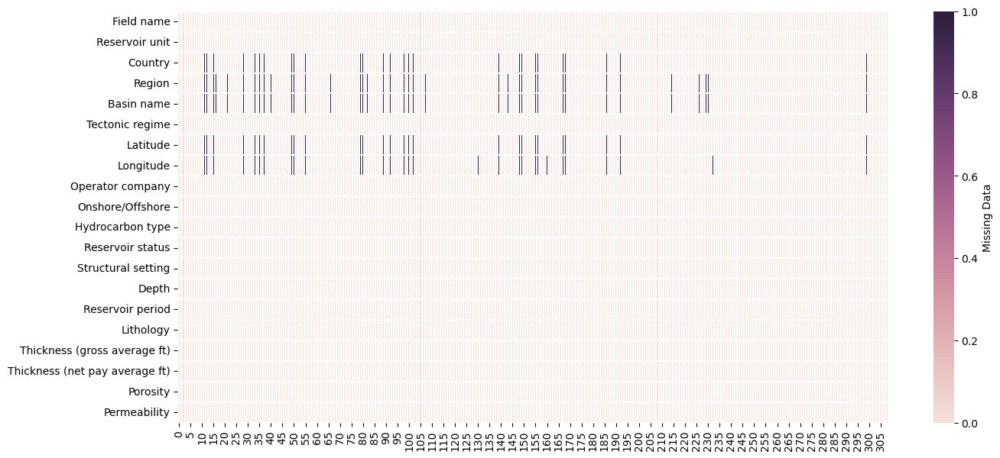

In [6]:
plt.figure(figsize=(15,7))

cmap = sns.cubehelix_palette(as_cmap=True, light=.9)

sns.heatmap(train.isna().transpose(), cmap=cmap,
            cbar_kws={'label': 'Missing Data'}, linewidths=0.05)

plt.savefig("visualizing_missing_data_with_heatmap_Seaborn_Python.png", dpi=100)

In [7]:
train.dtypes

Field name                         object
Reservoir unit                     object
Country                            object
Region                             object
Basin name                         object
Tectonic regime                    object
Latitude                          float64
Longitude                         float64
Operator company                   object
Onshore/Offshore                   object
Hydrocarbon type                   object
Reservoir status                   object
Structural setting                 object
Depth                               int64
Reservoir period                   object
Lithology                          object
Thickness (gross average ft)      float64
Thickness (net pay average ft)    float64
Porosity                          float64
Permeability                      float64
dtype: object

In [8]:
train = train.dropna()

### BoxPlot

**Диаграммы размаха («ящик с усами») (Box and Whisker Plot или Box Plot)** – это удобный способ визуального представления групп числовых данных через квартили.

Прямые линии, исходящие из ящика, называются «усами» и используются для обозначения степени разброса (дисперсии) за пределами верхнего и нижнего квартилей. Выбросы иногда отображаются в виде отдельных точек, находящихся на одной линии с усами. Диаграммы размаха могут располагаться как горизонтально, так и вертикально.

Диаграммы размаха, как правило, используются в описательной статистике и позволяют быстро исследовать один или более наборов данных в графическом виде. Несмотря на то, что в сравнении с гистограммой или графиком плотности, этот график может показаться примитивным, его преимущество – в экономии пространства, что особенно удобно при сравнении распределений между большим количеством групп или наборов данных.

Виды наблюдений, которые можно сделать на основе ящика с усами:
- Каковы ключевые значения, например: средний показатель, медиана 25го перцентиля и так далее.
- Существуют ли выбросы и каковы их значения.
- Симметричны ли данные.
- Насколько плотно сгруппированы данные.
- Смещены ли данные и, если да, то в каком направлении.

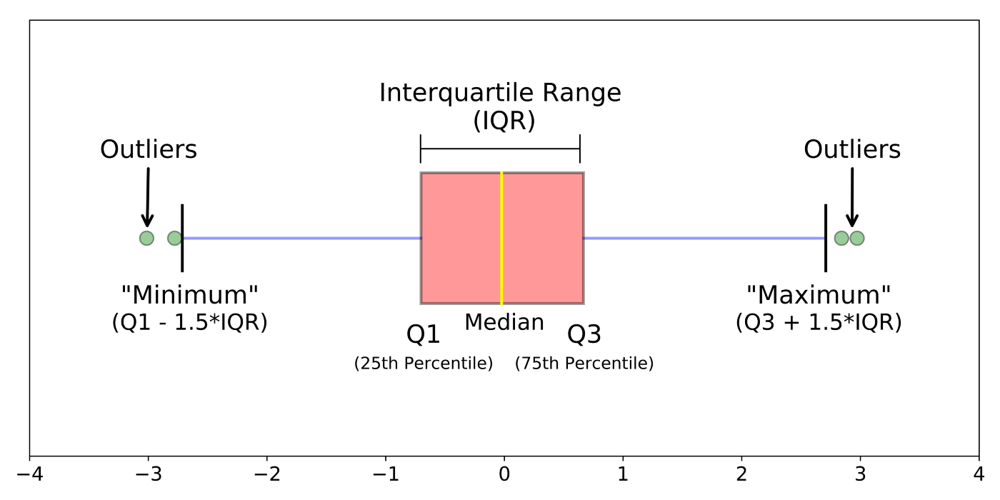

- медиана (Q2/50-й процентиль): среднее значение набора данных.
- первый квартиль (Q1/25-й процентиль): среднее число между наименьшим числом (не «минимум») и медианой набора данных.
- третий квартиль (Q3/75-й процентиль): среднее значение между медианой и максимальным значением (не «максимальным») набора данных.
- Межквартильный диапазон (IQR) : от 25-го до 75-го процентиля. IQR показывает, насколько разбросаны средние значения.
- «максимум»: Q3 + 1,5*IQR
- «минимум»: Q1 -1,5*IQR
- Выбросы : (обозначены зелеными кружками) В статистике выбросом является точка наблюдения, удаленная от других наблюдений.

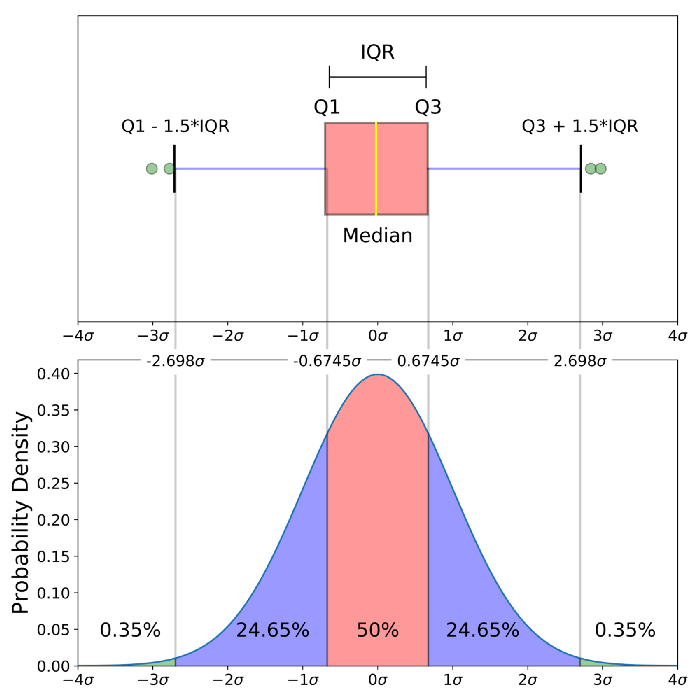

<Axes: >

<Figure size 500x500 with 0 Axes>

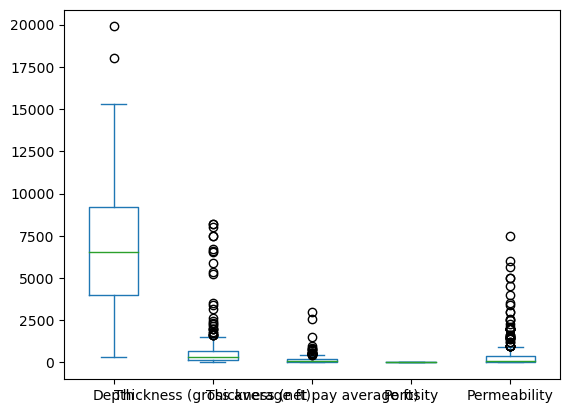

In [9]:
plt.figure(figsize=(5,5))

train[['Depth', 'Thickness (gross average ft)', 'Thickness (net pay average ft)', 'Porosity', 'Permeability']].plot(kind='box')

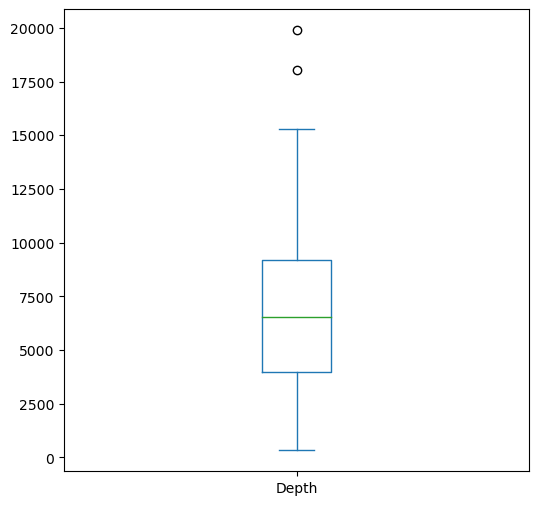

In [10]:
_, bp = train.Depth.plot.box(return_type='both', figsize=(6,6))

In [11]:
outliers = [flier.get_ydata() for flier in bp["fliers"]][0]
train[train.Depth.isin(outliers)]

,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Structural setting,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
224,MILLS RANCH,HUNTON (CHIMNEY HILL-HENRYHOUSE),USA,NORTH AMERICA,ANADARKO,COMPRESSION/EROSION,35.3676,-100.0793,CHEVRON,ONSHORE,GAS,NEARLY DEPLETED,THRUST,19888,SILURIAN,DOLOMITE,930.0,94.0,6.0,7.0
272,HATTERS POND,NORPHLET,USA,NORTH AMERICA,GULF OF MEXICO NORTHERN ONSHORE,GRAVITY/EXTENSION/EVAPORITE/DIAPIR/SYNSEDIMENT...,30.8976,-88.0660,CHEVRON,ONSHORE,GAS-CONDENSATE,DECLINING PRODUCTION,SALT/PASSIVE MARGIN,18050,JURASSIC,SANDSTONE,350.0,200.0,10.4,0.5


In [12]:
Q1 =  train.Depth.quantile(0.25)
Q3 = train.Depth.quantile(0.75)
IQR = Q3 - Q1

print(Q1)
print(IQR)
print(Q3)

train[(train.Depth < Q1-1.5*IQR ) | (train.Depth > Q3+1.5*IQR)]

4000.0
5189.5
9189.5


,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Structural setting,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
224,MILLS RANCH,HUNTON (CHIMNEY HILL-HENRYHOUSE),USA,NORTH AMERICA,ANADARKO,COMPRESSION/EROSION,35.3676,-100.0793,CHEVRON,ONSHORE,GAS,NEARLY DEPLETED,THRUST,19888,SILURIAN,DOLOMITE,930.0,94.0,6.0,7.0
272,HATTERS POND,NORPHLET,USA,NORTH AMERICA,GULF OF MEXICO NORTHERN ONSHORE,GRAVITY/EXTENSION/EVAPORITE/DIAPIR/SYNSEDIMENT...,30.8976,-88.0660,CHEVRON,ONSHORE,GAS-CONDENSATE,DECLINING PRODUCTION,SALT/PASSIVE MARGIN,18050,JURASSIC,SANDSTONE,350.0,200.0,10.4,0.5


<Axes: >

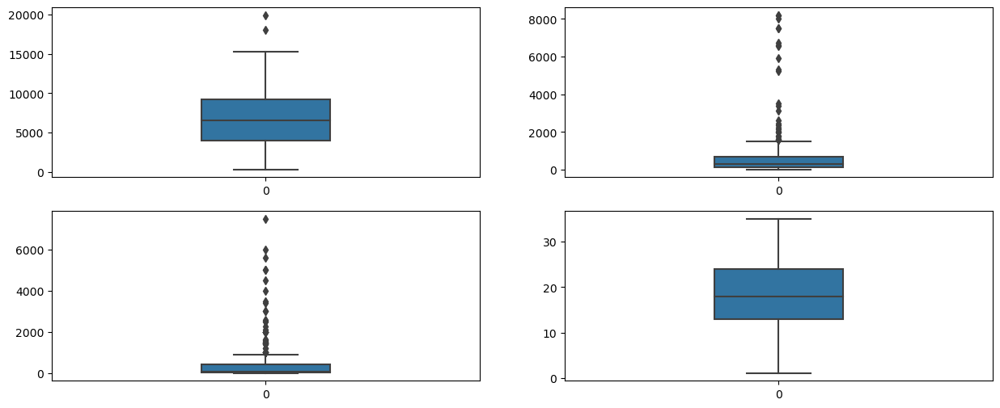

In [13]:
fig, axes = plt.subplots(2, 2, figsize=(15,6))

sns.boxplot(train['Depth'], ax=axes[0, 0], width=0.3)
sns.boxplot(train['Thickness (gross average ft)'], ax=axes[0, 1], width=0.3)
sns.boxplot(train['Permeability'], ax=axes[1,0], width=0.3)
sns.boxplot(train['Porosity'], ax=axes[1, 1], width=0.3)

https://medium.com/@agarwal.vishal819/outlier-detection-with-boxplots-1b6757fafa21

### Распределение переменных

Distplot - изображает изменение в распределении данных. Seaborn Distplot представляет собой общее распределение непрерывных переменных данных.

C:\Users\Admin\AppData\Local\Temp\ipykernel_37968\4021688797.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train['Depth'], bins=30)


<Axes: xlabel='Depth', ylabel='Density'>

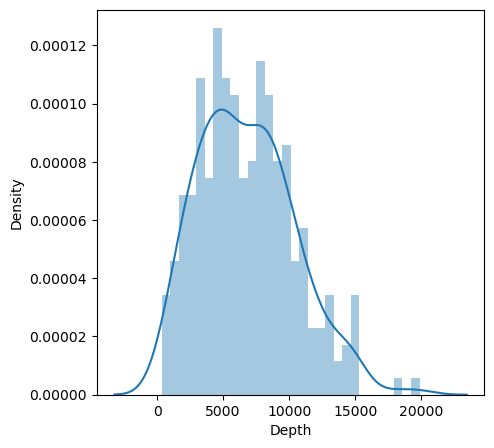

In [14]:
plt.figure(figsize=(5,5))

sns.distplot(train['Depth'], bins=30)

C:\Users\Admin\AppData\Local\Temp\ipykernel_37968\211666446.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train['Depth'], ax=axes[0, 0])
C:\Users\Admin\AppData\Local\Temp\ipykernel_37968\211666446.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train['Permeability'], ax=axes[0, 1])
C:\

<Axes: xlabel='Porosity', ylabel='Density'>

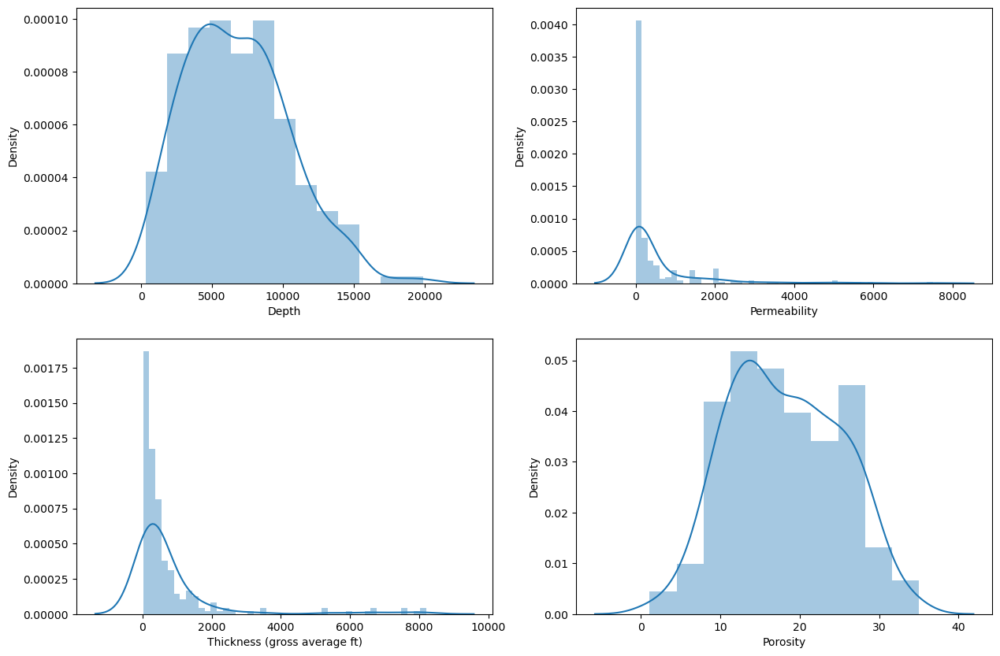

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(15,10))

sns.distplot(train['Depth'], ax=axes[0, 0])
sns.distplot(train['Permeability'], ax=axes[0, 1])
sns.distplot(train['Thickness (gross average ft)'], ax=axes[1,0])
sns.distplot(train['Porosity'], ax=axes[1, 1])

### Взаимосвязи между переменными

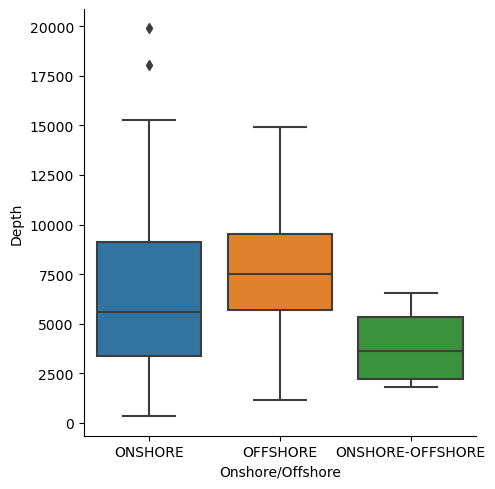

In [16]:
sns.catplot(x="Onshore/Offshore", y="Depth", kind = "box", data=train)

Давайте взглянем на первый из таких сложных графиков, график попарных отношений , который по умолчанию создает матрицу точечных графиков. Такой график помогает нам визуализировать взаимосвязь между различными переменными в одном выводе.

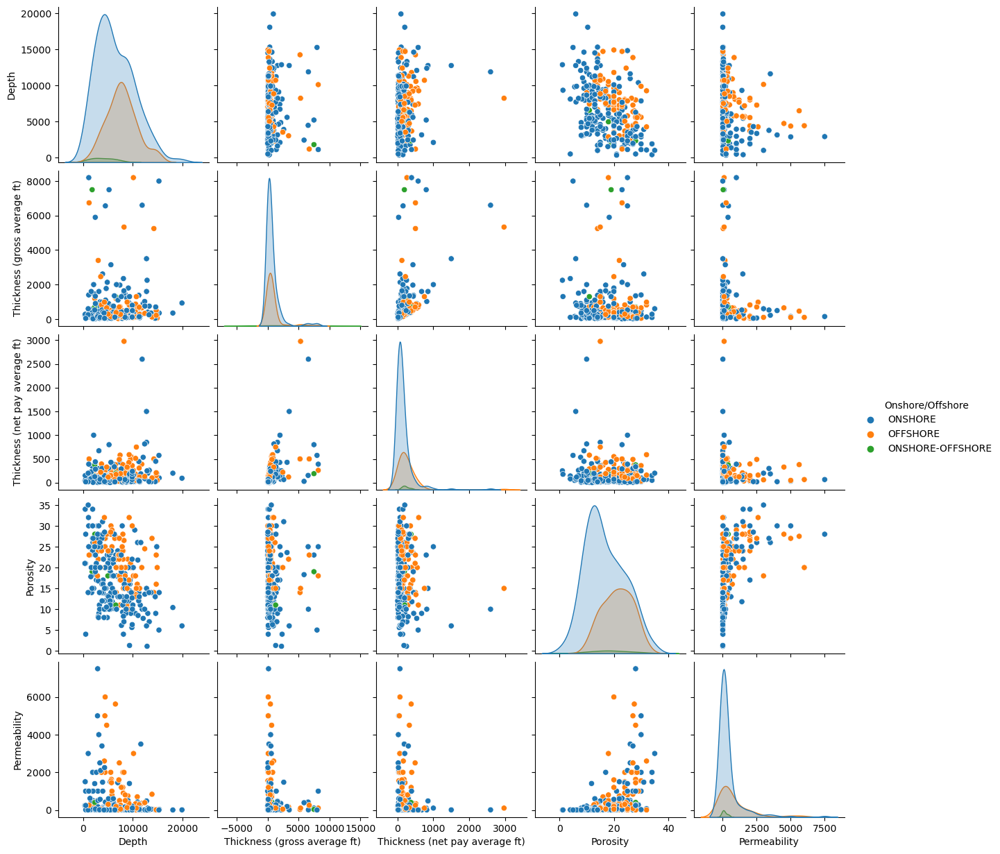

In [17]:
tmp = train[['Depth', 'Thickness (gross average ft)', 'Thickness (net pay average ft)', 'Porosity', 'Permeability', 'Onshore/Offshore']]
sns.pairplot(tmp, hue = 'Onshore/Offshore')

### Обработка категориальных признаков

In [18]:
train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Structural setting,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
0,ZHIRNOV,MELEKESKIAN,RUSSIA,FORMER SOVIET UNION,VOLGA-URAL,COMPRESSION/EVAPORITE,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,OIL,DECLINING PRODUCTION,FORELAND,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,LATIN AMERICA,ESPIRITO SANTO,EXTENSION,-19.6017,-39.8332,PETROBRAS,ONSHORE,OIL,NEARLY DEPLETED,PASSIVE MARGIN,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,MIDDLE EAST,THE GULF,COMPRESSION/EVAPORITE,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,OIL,REJUVENATING,FORELAND,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0
3,MURCHISON,BRENT,UK /NORWAY,EUROPE,NORTH SEA NORTHERN,EXTENSION,61.3833,1.7500,CNR,OFFSHORE,OIL,NEARLY DEPLETED,RIFT,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,NORTH AMERICA,WESTERN CANADA,COMPRESSION,53.2287,-115.8008,NUMEROUS,ONSHORE,OIL,UNKNOWN,FORELAND,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0


In [19]:
train['Tectonic regime'].value_counts()

COMPRESSION                                                 57
EXTENSION                                                   26
COMPRESSION/EROSION                                         25
COMPRESSION/EVAPORITE                                       18
INVERSION/COMPRESSION/EXTENSION                             17
EXTENSION/EROSION                                           12
GRAVITY/EXTENSION/EVAPORITE                                 10
COMPRESSION/EVAPORITE/EXTENSION/LINKED                       7
GRAVITY/EXTENSION/EVAPORITE/SYNSEDIMENTATION                 7
INVERSION/COMPRESSION/EXTENSION/EROSION                      7
INVERSION/STRIKE-SLIP/TRANSPRESSION/EXTENSION/BASEMENT-I     5
COMPRESSION/EXTENSION/LINKED                                 4
GRAVITY/EVAPORITE/COMPRESSION                                4
INVERSION/COMPRESSION/EXTENSION/EVAPORITE                    4
GRAVITY/EVAPORITE/EXTENSION                                  4
EXTENSION/EVAPORITE/EROSION/GRAVITY                    

Как мы видим в колонке 'Tectonic regime' множество разных категорий, причем одному объекту может соответствовать несколько категорий сразу.

Встает вопрос как обработать такие признаки.

In [20]:
train['Structural setting'].value_counts()

FORELAND                      67
RIFT                          43
INTRACRATONIC                 27
THRUST                        14
PASSIVE MARGIN                12
SALT/FORELAND                 11
SALT/PASSIVE MARGIN            9
INVERSION/RIFT                 7
DELTA/PASSIVE MARGIN           7
INVERSION/BACKARC              6
SALT/INVERSION/RIFT            5
DELTA/SALT/PASSIVE MARGIN      5
THRUST/FORELAND                4
SUB-THRUST/FORELAND            4
RIFT/SALT                      4
RIFT/INVERSION                 3
SUB-SALT/RIFT                  3
SUB-SALT/FORELAND              3
WRENCH                         3
BACKARC                        3
SALT/RIFT                      2
FORELAND/SALT                  2
FORELAND/THRUST                2
THRUST/SUB-THRUST/FORELAND     2
SUB-SALT/INVERSION             2
SUB-THRUST                     2
WRENCH/DELTA                   2
SUB-SALT                       1
INVERSION/FORELAND             1
RIFT/PASSIVE MARGIN            1
SALT/INVER

In [21]:
train['Basin name'].value_counts()

WESTERN CANADA                     24
GULF OF MEXICO NORTHERN ONSHORE    19
NORTH SEA CENTRAL                  14
NORTH SEA NORTHERN                 12
PERMIAN                            10
                                   ..
SIERRA GRANDE UPLIFT                1
FORT WORTH                          1
OTWAY                               1
UINTA/PICEANCE                      1
UINTA                               1
Name: Basin name, Length: 92, dtype: int64

In [22]:
train = train.drop(columns=['Tectonic regime', 'Structural setting'])
train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
0,ZHIRNOV,MELEKESKIAN,RUSSIA,FORMER SOVIET UNION,VOLGA-URAL,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,OIL,DECLINING PRODUCTION,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,LATIN AMERICA,ESPIRITO SANTO,-19.6017,-39.8332,PETROBRAS,ONSHORE,OIL,NEARLY DEPLETED,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,MIDDLE EAST,THE GULF,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,OIL,REJUVENATING,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0
3,MURCHISON,BRENT,UK /NORWAY,EUROPE,NORTH SEA NORTHERN,61.3833,1.7500,CNR,OFFSHORE,OIL,NEARLY DEPLETED,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,NORTH AMERICA,WESTERN CANADA,53.2287,-115.8008,NUMEROUS,ONSHORE,OIL,UNKNOWN,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0


In [23]:
train['Hydrocarbon type'].value_counts()

OIL               200
GAS                40
GAS-CONDENSATE     26
CARBON DIOXIDE      2
Name: Hydrocarbon type, dtype: int64

In [24]:
train['Field name'].value_counts()

ERSKINE             3
LAOJUNMIAO          3
ELK BASIN           2
HIBERNIA            2
SAIH RAWL           2
                   ..
SHANSHAN            1
HUTTON NORTHWEST    1
WANGCHANG           1
IAGIFU-HEDINIA      1
WELL DRAW           1
Name: Field name, Length: 251, dtype: int64

In [25]:
train['Reservoir unit'].value_counts()

BRENT                      8
SAN ANDRES                 6
SHUAIBA                    5
TOR-EKOFISK                4
RED SERIES                 3
                          ..
WILCOX (G SAND)            1
SANJIANFANG                1
QIANJIANG                  1
TORO                       1
MESAVERDE (TEAPOT SAND)    1
Name: Reservoir unit, Length: 225, dtype: int64

In [26]:
train['Country'].value_counts()

USA                    77
CANADA                 33
CHINA                  19
UK                     19
RUSSIA                 16
NORWAY                 11
INDONESIA               9
AUSTRALIA               7
OMAN                    6
EGYPT                   6
BRAZIL                  5
FRANCE                  5
TURKMENISTAN            5
UAE                     4
INDIA                   4
VENEZUELA               4
QATAR                   3
KAZAKHSTAN              3
NIGERIA                 2
TUNISIA                 2
PAPUA NEW GUINEA        2
NEUTRAL ZONE            2
SAUDI ARABIA            2
MALAYSIA                2
LIBYA                   2
COLOMBIA                2
THAILAND                2
TUNISIA /ALGERIA        1
IRAQ                    1
DENMARK                 1
SOUTH AFRICA            1
AFGHANISTAN             1
TURKEY                  1
EQUATORIAL GUINEA       1
GABON                   1
UK /NORWAY              1
IRAN                    1
TRINIDAD AND TOBAGO     1
UZBEKISTAN  

In [27]:
train['Onshore/Offshore'].value_counts()

ONSHORE             187
OFFSHORE             77
ONSHORE-OFFSHORE      4
Name: Onshore/Offshore, dtype: int64

Остальные категориальные признаки устроены проще и к ним можно применить обычные методы кодирования, которые мы изучали до этого.

Применим к ним кодировщик LabelEncoder().

In [28]:
categ = ['Hydrocarbon type', 'Reservoir status', 'Reservoir period', 'Lithology', 'Region']

for i in categ:
    print(i)
    print(set(test[i].unique()).difference(set(train[i].unique())))
    print('-'*15)

Hydrocarbon type
{'BITUMEN', 'METHANE HYDRATE'}
---------------
Reservoir status
set()
---------------
Reservoir period
{'PERMIAN-TRIASSIC', 'PALEOZOIC-CRETACEOUS', 'PROTEROZOIC-CAMBRIAN', 'CAMBRIAN-ORDOVICIAN/CARBONIFEROUS', 'CARBONIFEROUS-CRETACEOUS', 'ARCHEAN'}
---------------
Lithology
{'DIATOMITE', 'GLAUCONITIC SANDSTONE', 'CHERT', 'BASEMENT'}
---------------
Region
{nan}
---------------


In [29]:
from sklearn import preprocessing
# Encode Categorical Columns
# создание и обучение
le = preprocessing.LabelEncoder()
train['Region'] = le.fit_transform(train['Region'])

train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
0,ZHIRNOV,MELEKESKIAN,RUSSIA,3,VOLGA-URAL,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,OIL,DECLINING PRODUCTION,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,4,ESPIRITO SANTO,-19.6017,-39.8332,PETROBRAS,ONSHORE,OIL,NEARLY DEPLETED,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,5,THE GULF,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,OIL,REJUVENATING,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0
3,MURCHISON,BRENT,UK /NORWAY,1,NORTH SEA NORTHERN,61.3833,1.7500,CNR,OFFSHORE,OIL,NEARLY DEPLETED,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,6,WESTERN CANADA,53.2287,-115.8008,NUMEROUS,ONSHORE,OIL,UNKNOWN,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0


In [30]:
from sklearn import preprocessing
# Encode Categorical Columns
# создание и обучение
le = preprocessing.LabelEncoder()
train['Reservoir status'] = le.fit_transform(train['Reservoir status'])

train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
0,ZHIRNOV,MELEKESKIAN,RUSSIA,3,VOLGA-URAL,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,OIL,2,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,4,ESPIRITO SANTO,-19.6017,-39.8332,PETROBRAS,ONSHORE,OIL,6,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,5,THE GULF,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,OIL,8,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0
3,MURCHISON,BRENT,UK /NORWAY,1,NORTH SEA NORTHERN,61.3833,1.7500,CNR,OFFSHORE,OIL,6,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,6,WESTERN CANADA,53.2287,-115.8008,NUMEROUS,ONSHORE,OIL,12,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0


In [31]:
train = pd.get_dummies(train, columns=['Hydrocarbon type', 'Reservoir period', 'Lithology'])
train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Latitude,Longitude,Operator company,Onshore/Offshore,Reservoir status,...,Lithology_DOLOMITE,Lithology_DOLOMITIC LIMESTONE,Lithology_LIMESTONE,Lithology_LOW-RESISTIVITY SANDSTONE,Lithology_SANDSTONE,Lithology_SHALE,Lithology_SHALY SANDSTONE,Lithology_SILTSTONE,Lithology_THINLY-BEDDED SANDSTONE,Lithology_VOLCANICS
0,ZHIRNOV,MELEKESKIAN,RUSSIA,3,VOLGA-URAL,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,2,...,0,0,0,0,1,0,0,0,0,0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,4,ESPIRITO SANTO,-19.6017,-39.8332,PETROBRAS,ONSHORE,6,...,0,0,0,0,1,0,0,0,0,0
2,ABQAIQ,ARAB D,SAUDI ARABIA,5,THE GULF,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,8,...,0,0,1,0,0,0,0,0,0,0
3,MURCHISON,BRENT,UK /NORWAY,1,NORTH SEA NORTHERN,61.3833,1.7500,CNR,OFFSHORE,6,...,0,0,0,0,1,0,0,0,0,0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,6,WESTERN CANADA,53.2287,-115.8008,NUMEROUS,ONSHORE,12,...,1,0,0,0,0,0,0,0,0,0


In [32]:
crr = train.corr()

C:\Users\Admin\AppData\Local\Temp\ipykernel_37968\3179427425.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  crr = train.corr()


Heatmap позволяет визуадизировать матрицу корреляции между данными.

Корреляция - важнейший фактор, лежащий в основе анализа данных. Он сообщает, как переменные в наборе данных связаны друг с другом и как они перемещаются относительно друг друга. Значение корреляции колеблется от -1 до +1. 0 Корреляция означает, что две переменные не зависят друг от друга. Положительная корреляция указывает на то, что переменные движутся в одном направлении, а отрицательная корреляция указывает на противоположное.

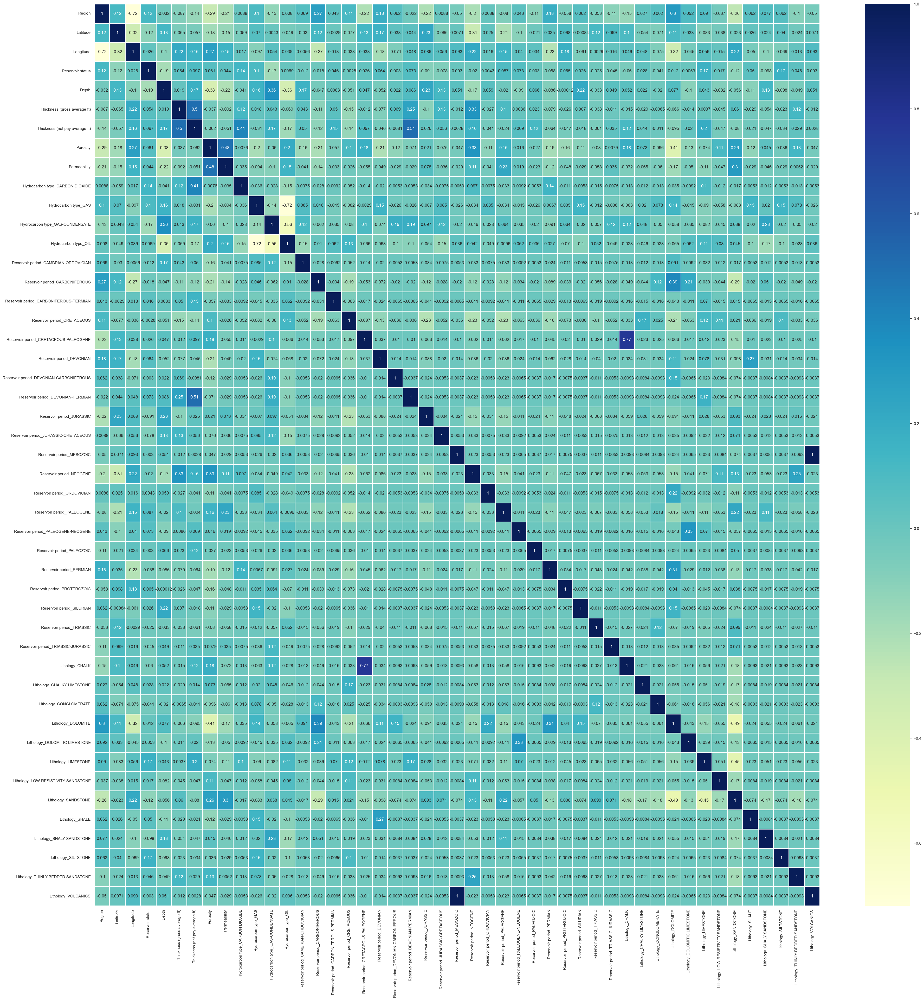

In [33]:
sns.set(rc = {'figure.figsize':(45,45)})

sns.heatmap(crr, annot = True, cmap="YlGnBu", linecolor='white',linewidths=1)

plt.savefig("heatmap.png")

По сути, это сетка цветных квадратов , где каждый квадрат, или bin , отмечает пересечение значений двух переменных, которые простираются вдоль горизонтальной и вертикальной осей.

Цветовые палитры: https://seaborn.pydata.org/tutorial/color_palettes.html

Информация о HeatMap: https://seaborn.pydata.org/generated/seaborn.heatmap.html


In [34]:
train.columns

Index(['Field name', 'Reservoir unit', 'Country', 'Region', 'Basin name',
       'Latitude', 'Longitude', 'Operator company', 'Onshore/Offshore',
       'Reservoir status', 'Depth', 'Thickness (gross average ft)',
       'Thickness (net pay average ft)', 'Porosity', 'Permeability',
       'Hydrocarbon type_CARBON DIOXIDE', 'Hydrocarbon type_GAS',
       'Hydrocarbon type_GAS-CONDENSATE', 'Hydrocarbon type_OIL',
       'Reservoir period_CAMBRIAN-ORDOVICIAN',
       'Reservoir period_CARBONIFEROUS',
       'Reservoir period_CARBONIFEROUS-PERMIAN', 'Reservoir period_CRETACEOUS',
       'Reservoir period_CRETACEOUS-PALEOGENE', 'Reservoir period_DEVONIAN',
       'Reservoir period_DEVONIAN-CARBONIFEROUS',
       'Reservoir period_DEVONIAN-PERMIAN', 'Reservoir period_JURASSIC',
       'Reservoir period_JURASSIC-CRETACEOUS', 'Reservoir period_MESOZOIC',
       'Reservoir period_NEOGENE', 'Reservoir period_ORDOVICIAN',
       'Reservoir period_PALEOGENE', 'Reservoir period_PALEOGENE-NEOGENE',


c:\Users\Admin\anaconda3\lib\site-packages\seaborn\axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


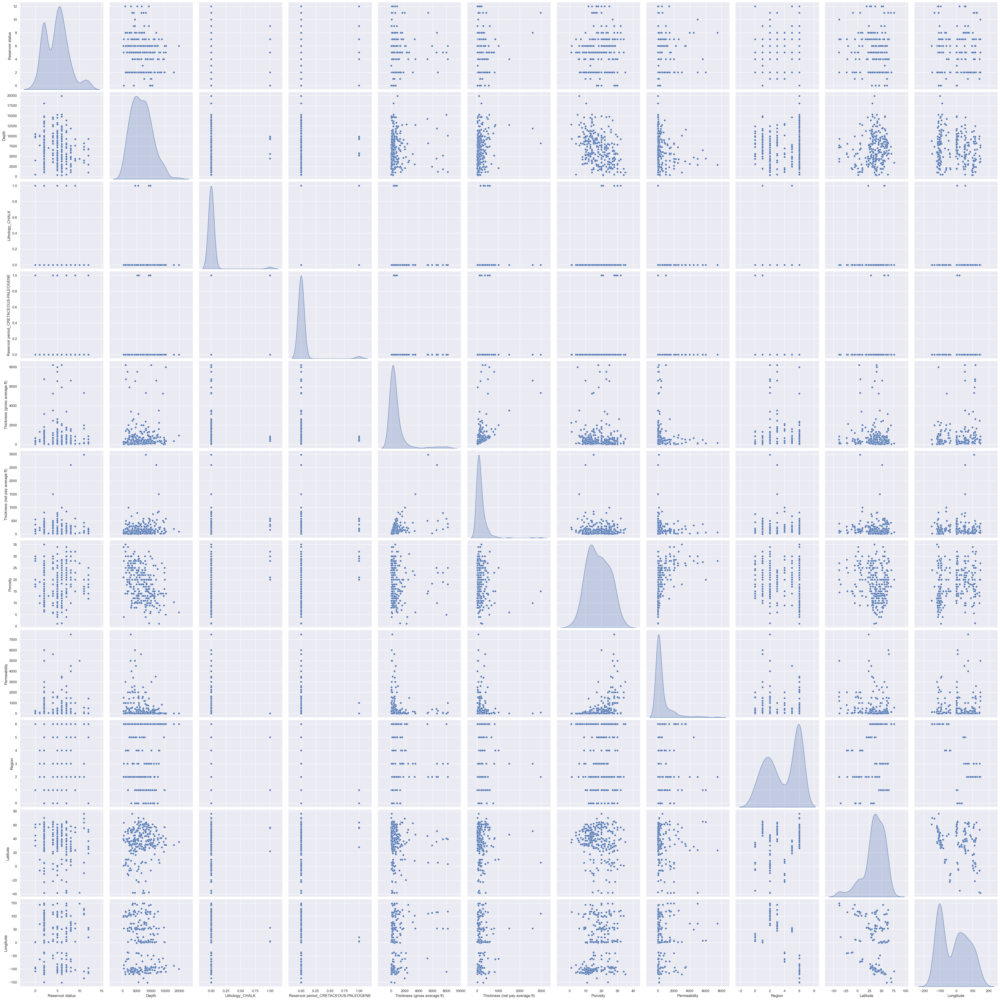

<Figure size 4500x4500 with 0 Axes>

In [35]:
sns.set()
columns = ['Onshore/Offshore', 'Reservoir status', 'Depth', 'Lithology_CHALK', 'Reservoir period_CRETACEOUS-PALEOGENE',
           'Thickness (gross average ft)', 'Thickness (net pay average ft)', 'Porosity', 'Permeability', 'Region', 'Latitude', 'Longitude']

sns.pairplot(train[columns], size = 4, kind ='scatter', diag_kind='kde')
plt.show()

plt.savefig("pairplot.png")

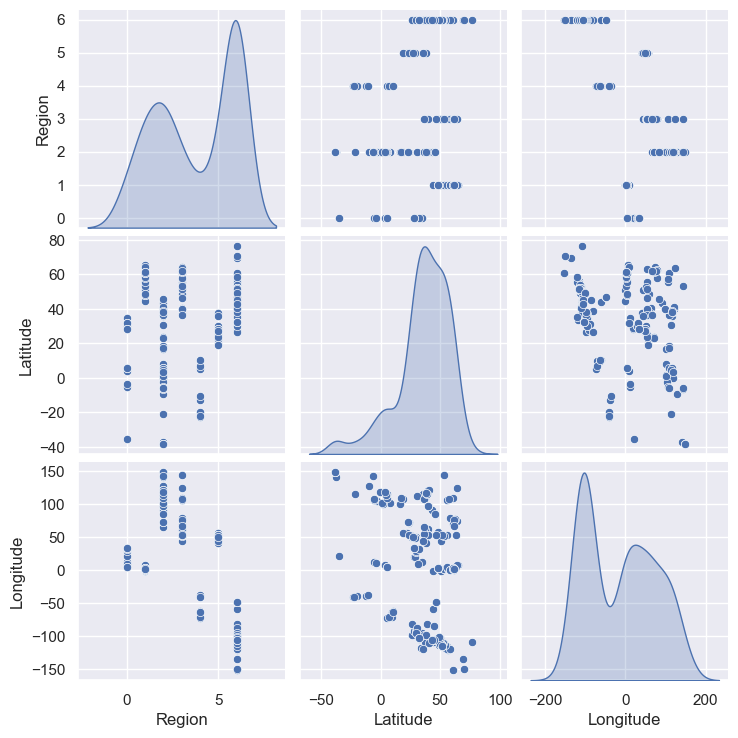

In [36]:
sns.set()
columns = ['Region', 'Latitude', 'Longitude']

sns.pairplot(train[columns], kind ='scatter', diag_kind='kde')
plt.show()

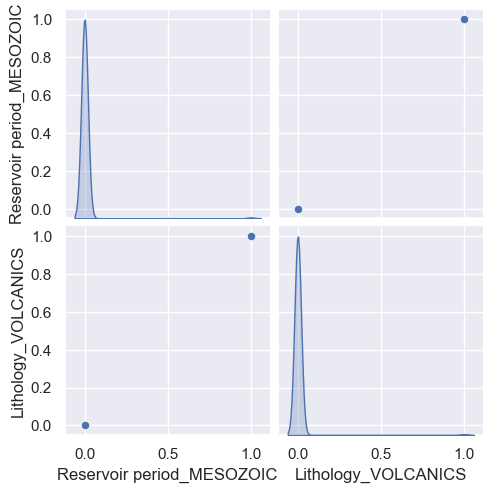

In [37]:
sns.set()
columns = ['Reservoir period_MESOZOIC', 'Lithology_VOLCANICS']

sns.pairplot(train[columns], kind ='scatter', diag_kind='kde')
plt.show()

Посмотрим на баланс классов.

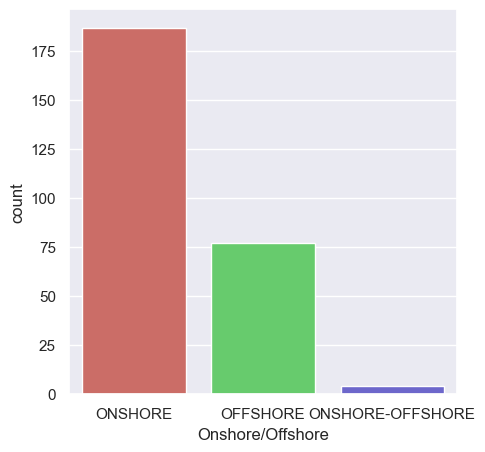

In [38]:
sns.set(rc = {'figure.figsize':(5,5)})
y_data = pd.DataFrame(train['Onshore/Offshore'])
sns.countplot(x='Onshore/Offshore', data=y_data, palette='hls')
plt.show()

In [39]:
train.head()

,Field name,Reservoir unit,Country,Region,Basin name,Latitude,Longitude,Operator company,Onshore/Offshore,Reservoir status,...,Lithology_DOLOMITE,Lithology_DOLOMITIC LIMESTONE,Lithology_LIMESTONE,Lithology_LOW-RESISTIVITY SANDSTONE,Lithology_SANDSTONE,Lithology_SHALE,Lithology_SHALY SANDSTONE,Lithology_SILTSTONE,Lithology_THINLY-BEDDED SANDSTONE,Lithology_VOLCANICS
0,ZHIRNOV,MELEKESKIAN,RUSSIA,3,VOLGA-URAL,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,2,...,0,0,0,0,1,0,0,0,0,0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,4,ESPIRITO SANTO,-19.6017,-39.8332,PETROBRAS,ONSHORE,6,...,0,0,0,0,1,0,0,0,0,0
2,ABQAIQ,ARAB D,SAUDI ARABIA,5,THE GULF,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,8,...,0,0,1,0,0,0,0,0,0,0
3,MURCHISON,BRENT,UK /NORWAY,1,NORTH SEA NORTHERN,61.3833,1.7500,CNR,OFFSHORE,6,...,0,0,0,0,1,0,0,0,0,0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,6,WESTERN CANADA,53.2287,-115.8008,NUMEROUS,ONSHORE,12,...,1,0,0,0,0,0,0,0,0,0


In [40]:
train = train.drop(columns=['Field name','Reservoir unit', 'Country','Basin name', 'Operator company'])

In [41]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 268 entries, 0 to 308
Data columns (total 48 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Region                                   268 non-null    int32  
 1   Latitude                                 268 non-null    float64
 2   Longitude                                268 non-null    float64
 3   Onshore/Offshore                         268 non-null    object 
 4   Reservoir status                         268 non-null    int32  
 5   Depth                                    268 non-null    int64  
 6   Thickness (gross average ft)             268 non-null    float64
 7   Thickness (net pay average ft)           268 non-null    float64
 8   Porosity                                 268 non-null    float64
 9   Permeability                             268 non-null    float64
 10  Hydrocarbon type_CARBON DIOXIDE          268 non-n

## Обучение модели

In [42]:
X = train.drop(columns=['Onshore/Offshore'])
y = train['Onshore/Offshore']

In [43]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

print(f'Train dataset size: {X_train.shape}, {y_train.shape}')
print(f'Train dataset size: {X_test.shape}, {y_test.shape}')

Train dataset size: (187, 47), (187,)
Train dataset size: (81, 47), (81,)


In [44]:
from sklearn.tree import DecisionTreeClassifier

# Создадим модель дерева решений
model = DecisionTreeClassifier()

# обучение модели
model.fit(X_train, y_train)

# предсказание ответов для тестовой выборки
answers_pred = model.predict(X_test)

In [45]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# answers_pred - ответы которые вернула модель для X_test
# y_test - это правильные ответы для X_test
print(f'Accuracy: {accuracy_score(y_test, answers_pred)}')

Accuracy: 0.8641975308641975


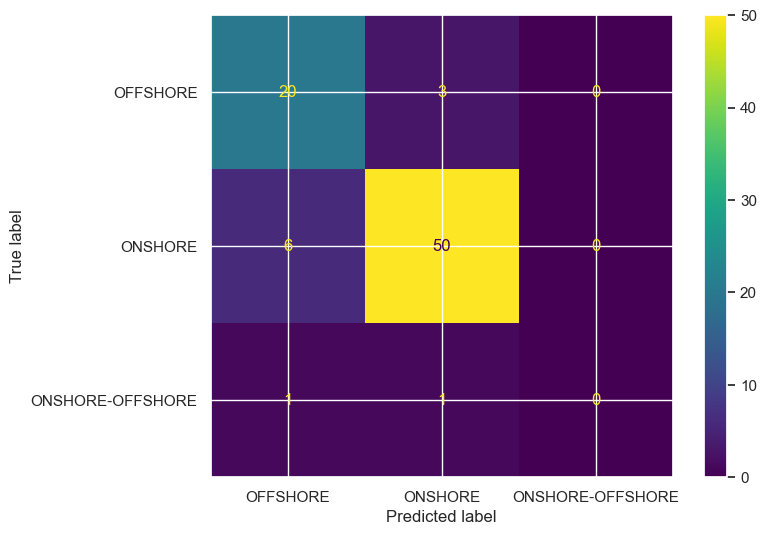

In [46]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, answers_pred)

fig, ax = plt.subplots(figsize=(8,6), dpi=100)

display = ConfusionMatrixDisplay(conf_matrix, display_labels=model.classes_)

display.plot(ax=ax)

# Самостоятельная работа. Предсказание местоположения нефти и газа.

In [173]:
import pandas as pd
import numpy as np

train = pd.read_csv('files//train_oil.csv')
test = pd.read_csv('files//oil_test.csv')

train.head(10)

,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Structural setting,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability
0,ZHIRNOV,MELEKESKIAN,RUSSIA,FORMER SOVIET UNION,VOLGA-URAL,COMPRESSION/EVAPORITE,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,OIL,DECLINING PRODUCTION,FORELAND,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,LATIN AMERICA,ESPIRITO SANTO,EXTENSION,-19.6017,-39.8332,PETROBRAS,ONSHORE,OIL,NEARLY DEPLETED,PASSIVE MARGIN,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,MIDDLE EAST,THE GULF,COMPRESSION/EVAPORITE,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,OIL,REJUVENATING,FORELAND,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0
3,MURCHISON,BRENT,UK /NORWAY,EUROPE,NORTH SEA NORTHERN,EXTENSION,61.3833,1.7500,CNR,OFFSHORE,OIL,NEARLY DEPLETED,RIFT,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,NORTH AMERICA,WESTERN CANADA,COMPRESSION,53.2287,-115.8008,NUMEROUS,ONSHORE,OIL,UNKNOWN,FORELAND,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0
5,UCHKYR,XV-1,UZBEKISTAN,FORMER SOVIET UNION,AMU DARYA,INVERSION/COMPRESSION/EXTENSION/EVAPORITE,40.1494,62.9906,SREDAZGAZPROM,ONSHORE,GAS,DECLINING PRODUCTION,INVERSION/RIFT,5443,JURASSIC,DOLOMITE,82.0,59.0,16.0,61.0
6,WESTHOPE SOUTH,CHARLES,USA,NORTH AMERICA,WILLISTON,COMPRESSION,48.8521,-101.0130,AMERADA HESS,ONSHORE,OIL,MATURE PRODUCTION,INTRACRATONIC,3275,CARBONIFEROUS,DOLOMITIC LIMESTONE,43.0,15.5,10.0,2.6
7,MCALLEN RANCH,LOWER VICKSBURG,USA,NORTH AMERICA,GULF OF MEXICO NORTHERN ONSHORE,GRAVITY/EXTENSION/SHALE/SYNSEDIMENTATION,26.6226,-98.3153,SHELL,ONSHORE,GAS,MATURE PRODUCTION,DELTA/PASSIVE MARGIN,9400,PALEOGENE,SANDSTONE,300.0,140.0,16.0,0.6
8,ELLIS RANCH,CLEVELAND,USA,NORTH AMERICA,ANADARKO,COMPRESSION/EROSION,36.2724,-100.7161,NUMEROUS,ONSHORE,GAS,DECLINING PRODUCTION,FORELAND,6500,CARBONIFEROUS,SHALY SANDSTONE,150.0,26.0,14.0,0.4
9,STRACHAN,LEDUC,CANADA,NORTH AMERICA,WESTERN CANADA,COMPRESSION,52.4500,-115.4286,BANF AND AQUITAINE,ONSHORE,GAS,NEARLY DEPLETED,FORELAND,12068,DEVONIAN,DOLOMITE,900.0,535.0,7.8,11.0


In [174]:
train.isna().sum()

Field name                         0
Reservoir unit                     0
Country                           27
Region                            38
Basin name                        38
Tectonic regime                    0
Latitude                          27
Longitude                         30
Operator company                   0
Onshore/Offshore                   0
Hydrocarbon type                   0
Reservoir status                   0
Structural setting                 0
Depth                              0
Reservoir period                   0
Lithology                          0
Thickness (gross average ft)       0
Thickness (net pay average ft)     0
Porosity                           0
Permeability                       0
dtype: int64

In [175]:
train.dropna(inplace=True)

In [176]:
train.isna().sum()

Field name                        0
Reservoir unit                    0
Country                           0
Region                            0
Basin name                        0
Tectonic regime                   0
Latitude                          0
Longitude                         0
Operator company                  0
Onshore/Offshore                  0
Hydrocarbon type                  0
Reservoir status                  0
Structural setting                0
Depth                             0
Reservoir period                  0
Lithology                         0
Thickness (gross average ft)      0
Thickness (net pay average ft)    0
Porosity                          0
Permeability                      0
dtype: int64

In [143]:
from sklearn.preprocessing import OrdinalEncoder
import pandas as pd

train_category = train.select_dtypes([object])
test_category = test.select_dtypes([object])

encoder = OrdinalEncoder()

train_encoded = encoder.fit_transform(train_category)
test_encoded = encoder.fit_transform(test_category)

train_encoded_df = pd.DataFrame(train_encoded, columns=train_category.columns, index=train_category.index)
test_encoded_df = pd.DataFrame(test_encoded, columns=test_category.columns, index=test_category.index)

train_encoded_full = pd.concat([train.select_dtypes(exclude=object), train_encoded_df], axis=1)
test_encoded_full = pd.concat([test.select_dtypes(exclude=object), test_encoded_df], axis=1)

train_encoded_full.head(10)

,Latitude,Longitude,Depth,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Operator company,Onshore/Offshore,Hydrocarbon type,Reservoir status,Structural setting,Reservoir period,Lithology
0,51.0000,44.8042,1870,262.0,33.0,24.0,30.0,250.0,119.0,26.0,3.0,85.0,4.0,68.0,1.0,3.0,2.0,5.0,1.0,7.0
1,-19.6017,-39.8332,4843,2133.0,72.0,23.0,350.0,121.0,96.0,3.0,4.0,20.0,17.0,80.0,1.0,3.0,6.0,15.0,13.0,7.0
2,26.0800,49.8100,6050,250.0,184.0,21.0,410.0,0.0,14.0,27.0,5.0,80.0,4.0,93.0,1.0,3.0,8.0,5.0,8.0,5.0
3,61.3833,1.7500,8988,425.0,300.0,22.0,750.0,150.0,34.0,37.0,1.0,50.0,17.0,30.0,0.0,3.0,6.0,16.0,8.0,7.0
4,53.2287,-115.8008,9306,233.0,167.0,11.8,1407.0,233.0,132.0,4.0,6.0,87.0,0.0,70.0,1.0,3.0,12.0,5.0,5.0,3.0
5,40.1494,62.9906,5443,82.0,59.0,16.0,61.0,216.0,219.0,39.0,3.0,1.0,41.0,100.0,1.0,1.0,2.0,13.0,8.0,3.0
6,48.8521,-101.0130,3275,43.0,15.5,10.0,2.6,234.0,46.0,38.0,6.0,89.0,0.0,4.0,1.0,3.0,5.0,9.0,1.0,4.0
7,26.6226,-98.3153,9400,300.0,140.0,16.0,0.6,137.0,109.0,38.0,6.0,31.0,35.0,94.0,1.0,1.0,5.0,2.0,13.0,7.0
8,36.2724,-100.7161,6500,150.0,26.0,14.0,0.4,73.0,52.0,38.0,6.0,2.0,1.0,70.0,1.0,1.0,2.0,5.0,1.0,9.0
9,52.4500,-115.4286,12068,900.0,535.0,7.8,11.0,201.0,102.0,4.0,6.0,87.0,0.0,10.0,1.0,1.0,6.0,5.0,5.0,3.0


<Axes: >

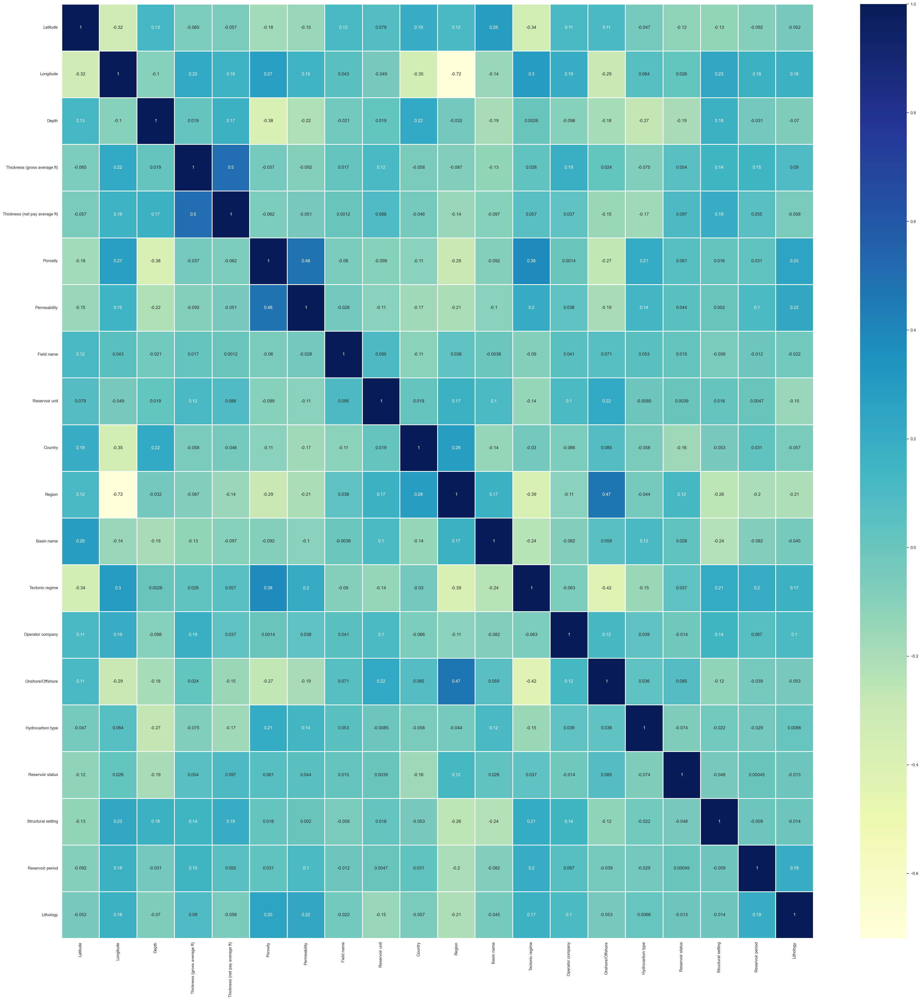

In [144]:
sns.set(rc = {'figure.figsize':(45,45)})

sns.heatmap(train_encoded_full.corr(), annot = True, cmap="YlGnBu", linecolor='white',linewidths=1)

In [145]:
from sklearn.model_selection import train_test_split

X = train_encoded_full.drop(columns=['Onshore/Offshore'])
y = train_encoded_full['Onshore/Offshore']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=43, stratify=y)

**Decision Tree Classifier**

In [146]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': [300, 350, 400, 450, 500], 'max_depth': [3, 5, 7, 10], 'min_samples_leaf': [3, 5, 7, 10]}

rf_grid = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf_grid, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Лучшие параметры: ", grid_search.best_params_)

c:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Лучшие параметры:  {'max_depth': 7, 'min_samples_leaf': 5, 'n_estimators': 400}


In [147]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score

rf = RandomForestClassifier(n_estimators = 400, max_depth = 7, min_samples_leaf = 5)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

print(f'Accuracy = {accuracy_score(y_test, y_pred)}')

Accuracy = 0.9552238805970149


**CatBoost Classifier**

In [177]:
train['Onshore/Offshore'] = train['Onshore/Offshore'].replace({'ONSHORE': 1, 'OFFSHORE': 0, 'ONSHORE-OFFSHORE':1})

In [178]:
from catboost import CatBoostClassifier

cat_list = train.select_dtypes(include='object').columns.to_list()

X = train.drop("Onshore/Offshore", axis=1)  
y = train["Onshore/Offshore"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

catboost_model = CatBoostClassifier(random_seed=42, cat_features=cat_list, verbose=0, n_estimators=100, depth = 6, learning_rate = 0.2)
catboost_model.fit(X, y)

catboost_predictions = catboost_model.predict(X_test)
catboost_probabilities = catboost_model.predict_proba(X_test)[:, 1]

catboost_accuracy = accuracy_score(y_test, catboost_predictions)

print("CatBoost:")
print("Accuracy:", catboost_accuracy)

CatBoost:
Accuracy: 0.9814814814814815


In [73]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'iterations': [50, 100, 200, 300, 500], 'depth': [4, 6, 8, 10], 'learning_rate': [0.01, 0.03, 0.1, 0.2]}

cat_grid = CatBoostClassifier(random_state=42)
grid_search = GridSearchCV(estimator=cat_grid, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Лучшие параметры: ", grid_search.best_params_)

c:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


0:	learn: 1.0908380	total: 114ms	remaining: 5.57s
1:	learn: 1.0832461	total: 115ms	remaining: 2.75s
2:	learn: 1.0761379	total: 115ms	remaining: 1.8s
3:	learn: 1.0685535	total: 116ms	remaining: 1.33s
4:	learn: 1.0613316	total: 116ms	remaining: 1.04s
5:	learn: 1.0547227	total: 116ms	remaining: 853ms
6:	learn: 1.0476247	total: 117ms	remaining: 718ms
7:	learn: 1.0395961	total: 117ms	remaining: 616ms
8:	learn: 1.0329437	total: 118ms	remaining: 537ms
9:	learn: 1.0252184	total: 118ms	remaining: 474ms
10:	learn: 1.0184904	total: 119ms	remaining: 422ms
11:	learn: 1.0117931	total: 119ms	remaining: 378ms
12:	learn: 1.0039831	total: 120ms	remaining: 342ms
13:	learn: 0.9968414	total: 121ms	remaining: 310ms
14:	learn: 0.9896520	total: 121ms	remaining: 282ms
15:	learn: 0.9827773	total: 122ms	remaining: 258ms
16:	learn: 0.9761013	total: 122ms	remaining: 237ms
17:	learn: 0.9702779	total: 123ms	remaining: 218ms
18:	learn: 0.9640947	total: 123ms	remaining: 201ms
19:	learn: 0.9590072	total: 124ms	remainin

In [179]:
from catboost import CatBoostClassifier

test.fillna(0, inplace=True)
X_test = test
catboost_pred = catboost_model.predict(X_test)
X_test['Onshore/Offshore'] = catboost_pred
X_test['Onshore/Offshore'] = X_test['Onshore/Offshore'].replace({1:'ONSHORE', 0:'OFFSHORE'})
X_test['Index'] = X_test.index
X_test[['Index', 'Onshore/Offshore']].to_csv('submission.csv', index=False)
X_test[['Index', 'Onshore/Offshore']]

,Index,Onshore/Offshore
0,0,ONSHORE
1,1,OFFSHORE
2,2,ONSHORE
3,3,OFFSHORE
4,4,ONSHORE
...,...,...
128,128,ONSHORE
129,129,ONSHORE
130,130,ONSHORE
131,131,ONSHORE


**eXboost Classifier**

In [135]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': [50, 100, 200, 300, 500], 'max_depth': [3, 5, 7, 10], 'learning_rate': [0.01, 0.1, 0.2, 0.3]}

xgb_grid = XGBClassifier(random_state=42)
grid_search = GridSearchCV(estimator=xgb_grid, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Лучшие параметры: ", grid_search.best_params_)

c:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Лучшие параметры:  {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200}


In [148]:
xgb = XGBClassifier(n_estimators=200, max_depth=3, learning_rate=0.2, random_state=42)

xgb.fit(X_train, y_train)

y_pred = xgb.predict(X_test)

print(f'Accuracy = {accuracy_score(y_test, y_pred)}')

Accuracy = 0.9104477611940298


In [150]:
for col in test_encoded_full.columns[test_encoded_full.isna().sum() > 0].tolist():
    test_encoded_full[col].fillna(test_encoded_full[col].median(), inplace=True)

In [153]:
y_pred_test = pd.DataFrame(cat.predict(test_encoded_full), columns=['Onshore/Offshore'])
y_pred_test = y_pred_test.reset_index()

y_pred_test['Onshore/Offshore'] = y_pred_test['Onshore/Offshore'].replace({1.0: 'ONSHORE', 0.0: 'OFFSHORE', 2.0: 'ONSHORE/OFFSHORE'})

In [154]:
y_pred_test.to_csv("solution.csv", index=False)